In [20]:
import pandas as pd
import numpy as np
from datetime import timedelta
import matplotlib
import matplotlib.pyplot as plt

In [21]:
log = pd.read_csv('BPIC19.csv')
log['time:timestamp'] = pd.to_datetime(log['time:timestamp'], utc=True)


## exploratory

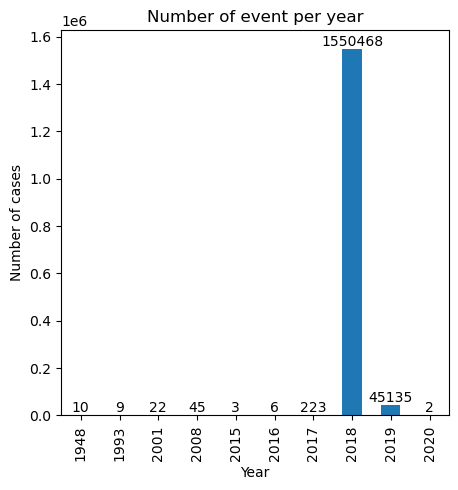

In [22]:
event_per_year = log.groupby(log['time:timestamp'].dt.year).size()
plt.figure(figsize=(5, 5))

ax = event_per_year.plot(kind='bar')
plt.title('Number of event per year')
plt.xlabel('Year')
plt.ylabel('Number of cases')

for idx, value in enumerate(event_per_year):
    ax.text(idx, value, str(value), ha='center', va='bottom')

plt.show()

Text(0, 0.5, 'Days')

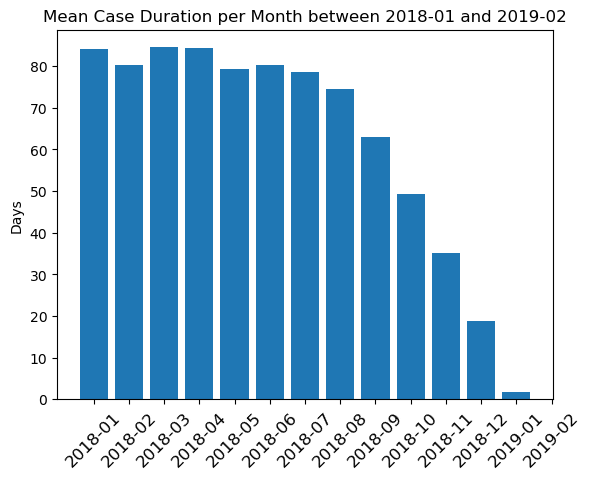

In [23]:
#TT 
case_group = log.groupby('case:concept:name')
case_start_times = case_group['time:timestamp'].min()
case_end_times = case_group['time:timestamp'].max()

mean_throughput_per_month = {}

start_date = '2018-01'
end_date = '2020-12'
monthly_range = pd.date_range(start=start_date, end=end_date, freq='M')

for current_month in monthly_range:
    case_start_df = case_start_times.to_frame().reset_index()
    cases_in_month = case_start_df[(case_start_df['time:timestamp'].dt.year == current_month.year) & 
                                   (case_start_df['time:timestamp'].dt.month == current_month.month)]
    
    #if not cases_in_month.empty:
    monthly_case_end_times = case_end_times[cases_in_month['case:concept:name']]
    monthly_case_start_times = cases_in_month.set_index('case:concept:name')['time:timestamp']
    case_throughputtime = monthly_case_end_times - monthly_case_start_times

    mean_throughput_per_month[current_month.strftime('%Y-%m')] = (case_throughputtime / timedelta(days=1)).mean()

plt.bar(mean_throughput_per_month.keys(), mean_throughput_per_month.values())
plt.tick_params(axis='x', rotation=45, labelsize=12)

plt.title('Mean Case Duration per Month between 2018-01 and 2019-02')
plt.ylabel('Days')

Text(0, 0.5, 'Days')

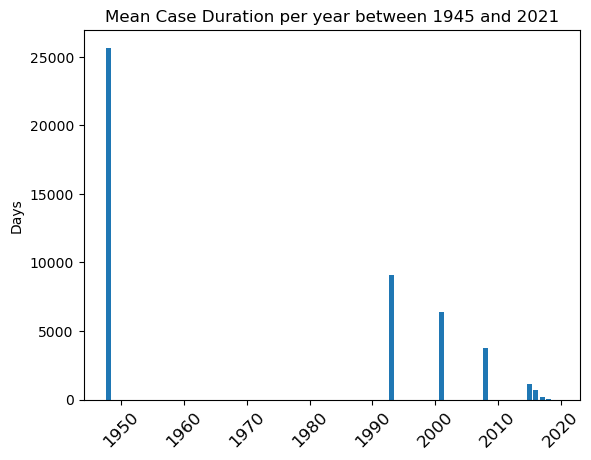

In [24]:
mean_throughput_per_yrly= {}


for year in range(1945, 2022):
    case_start_df = case_start_times.to_frame().reset_index()
    cases_in_yrly = case_start_df[(case_start_df['time:timestamp'].dt.year == year)]
    
    #if not cases_in_month.empty:
    yrly_case_end_times = case_end_times[cases_in_yrly['case:concept:name']]
    yrly_case_start_times = cases_in_yrly.set_index('case:concept:name')['time:timestamp']
    case_throughputtime = yrly_case_end_times - yrly_case_start_times

    mean_throughput_per_yrly[year] = (case_throughputtime / timedelta(days=1)).mean()

plt.bar(list(mean_throughput_per_yrly.keys()), mean_throughput_per_yrly.values())
plt.tick_params(axis='x', rotation=45, labelsize=12)

plt.title('Mean Case Duration per year between 1945 and 2021')
plt.ylabel('Days')

#### remove outliers

In [25]:
#filter start date
start_date = pd.to_datetime("2018-01-01", utc=True)
log_start = log[log['time:timestamp'] >= start_date]

log_start = log_start.sort_values(by='time:timestamp')

In [26]:
#filter end date
end_date = pd.to_datetime("2019-02-01", utc=True)
log_filtered = log_start[log_start['time:timestamp'] <= end_date]

log_filtered = log_filtered.sort_values(by='time:timestamp')

In [27]:
#find the MAX DAY
agg_dict = {"time:timestamp": ['min', 'max']}
duration_df = pd.DataFrame(log_filtered.groupby("case:concept:name").agg(agg_dict)).reset_index()
duration_df["duration"] = (duration_df[("time:timestamp", "max")] - duration_df[("time:timestamp", "min")]).dt.total_seconds() / (24 * 60 * 60)

sorted_durations = duration_df.sort_values(by="duration")

n = len(sorted_durations)
threshold_index = int(n * 0.95)
top_95_percent = sorted_durations.iloc[:threshold_index]

In [28]:
top_95_percent.iloc[-1]

case:concept:name                  4508050268_00100
time:timestamp     min    2018-08-21 11:15:00+00:00
                   max    2019-01-10 14:42:00+00:00
duration                                  142.14375
Name: 169342, dtype: object

In [29]:
def limited_duration(dataset, max_duration):
    '''

    limits dataset to cases shorter than maximal duration and debiases the end of the dataset
    by dropping cases starting after the last timestamp of the dataset - max_duration
    Args:
        dataset: pandas DataFrame
        max_duration: float

    Returns:
        dataset: pandas Dataframe
        latest_start: timeStamp with new end time for the dataset

    '''
    # compute each case's duration
    agg_dict = {"time:timestamp" :['min', 'max']}
    duration_df = pd.DataFrame(dataset.groupby("case:concept:name").agg(agg_dict)).reset_index()
    duration_df["duration"] = (duration_df[("time:timestamp","max")] - duration_df[("time:timestamp","min")]).dt.total_seconds() / (24 * 60 * 60)
    # condition 1: cases are shorter than max_duration
    condition_1 = duration_df["duration"] <= max_duration *1.00000000001
    cases_retained = duration_df[condition_1]["case:concept:name"].values
    dataset = dataset[dataset["case:concept:name"].isin(cases_retained)].reset_index(drop=True)
    return dataset, -1

In [30]:

log_remove=log_filtered.drop_duplicates(inplace=True)

log_remove=limited_duration(log_filtered, 143.33)[0]

###### log: the whole bpic19 dataset, log_start: only include data after 2018-01, log_filtered: (2018-01 to 2019-02), log_remove: after all the preprocessing

### splitting without discarding any cases

In [35]:
#train-test split
split_ratios = [0.55, 0.7, 0.75, 0.8, 0.9]

train_sets = {}
test_sets = {}
start_timestamp = log_remove.iloc[0]['time:timestamp']
end_timestamp = log_remove.iloc[-1]['time:timestamp']

datasets=[]

for ratio in split_ratios:
    
    print(f'Generating split... {ratio}')
    # preliminaries
    case_starts_df = log_remove.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = log_remove.groupby("case:concept:name")["time:timestamp"].min().to_frame()

    case_nr_list_start = case_starts_df.sort_values().index.array

    # TEST SET
    first_test_case_nr = int(len(case_nr_list_start) * ratio)
    first_test_start_time = np.sort(case_starts_df.values)[first_test_case_nr]
    # Retain cases that end after first_test_start time
    test_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values >= first_test_start_time].index.array
    df_test = log_remove[log_remove["case:concept:name"].isin(test_case_nrs)].reset_index(drop=True)

    # TRAINING SET
    train_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values < first_test_start_time].index.array
    df_train = log_remove[log_remove["case:concept:name"].isin(train_case_nrs)].reset_index(drop=True)


    datasets+=[(df_train, f'Train {ratio}', ), (df_test, f'Test {ratio}', ),]

Generating split... 0.55
Generating split... 0.7
Generating split... 0.75
Generating split... 0.8
Generating split... 0.9


In [36]:
##calculate summary statistics## 
from datetime import timedelta
import numpy as np

def calculate_statistics(df, set_name):
    num_cases = df['case:concept:name'].nunique()
    num_events = len(df)

    case_group = df.groupby('case:concept:name')
    events_per_case = case_group.size()

    median_events = events_per_case.median()
    average_events = events_per_case.mean()
    case_throughputtime = case_group['time:timestamp'].max() - case_group['time:timestamp'].min()
    case_throughputtime = case_throughputtime / timedelta(days=1)

    #Calculate throughput time statistics
    median_throughputtime = case_throughputtime.median()
    average_throughputtime = case_throughputtime.mean()

    max_throughputtime = case_throughputtime.max()
    dataset_throughputtime = (df['time:timestamp'].max() - df['time:timestamp'].min()) / timedelta(days=1)

    statistics = {
        'Dataset': set_name,
        'Num Cases': num_cases,
        'Num Events': num_events,
        'Median num Events': median_events,
        'Mean Case Length': average_events,
        'Median Case Duration': median_throughputtime,
        'Mean Case Duration': average_throughputtime,
        'Max Case Duration': max_throughputtime,
        'Dataset Case Duration': dataset_throughputtime
    }

    return statistics

In [37]:
stats_list = []

additional_datasets_with_labels = [
    (log, 'BPIC19'),
    (log_remove, 'BPIC19 outlier removed')
]

datasets_with_labels = datasets+additional_datasets_with_labels
for dataset, label in datasets_with_labels:
    stats_list.append(calculate_statistics(dataset, label))


In [38]:
all_stats_df = pd.DataFrame(stats_list)

In [39]:
all_stats_df

,Dataset,Num Cases,Num Events,Median num Events,Mean Case Length,Median Case Duration,Mean Case Duration,Max Case Duration,Dataset Case Duration
0,Train 0.55,131870,828527,5.0,6.282907,72.022569,72.232325,143.328472,332.522917
1,Test 0.55,107896,651396,5.0,6.037258,49.198958,52.180801,143.236111,189.722917
2,Train 0.7,167696,1054659,5.0,6.289112,72.084028,72.453451,143.328472,381.456944
3,Test 0.7,72070,425264,5.0,5.900708,36.999306,41.698660,133.784722,134.054861
4,Train 0.75,179612,1136403,5.0,6.326988,71.918056,71.768144,143.328472,381.590278
5,Test 0.75,60154,343520,5.0,5.710676,34.397917,37.652634,113.786111,114.054861
6,Train 0.8,191810,1215702,5.0,6.338053,71.011806,70.803040,143.328472,381.590278
7,Test 0.8,47956,264221,5.0,5.509655,30.476389,32.835209,94.618750,95.054861
8,Train 0.9,215665,1359159,5.0,6.302177,65.973611,67.683406,143.328472,381.780556
9,Test 0.9,24101,120764,4.0,5.010746,23.730556,23.170602,60.611111,61.013194


In [40]:
train_set_clean3 = datasets[2][0]
test_set_clean3 = datasets[3][0]

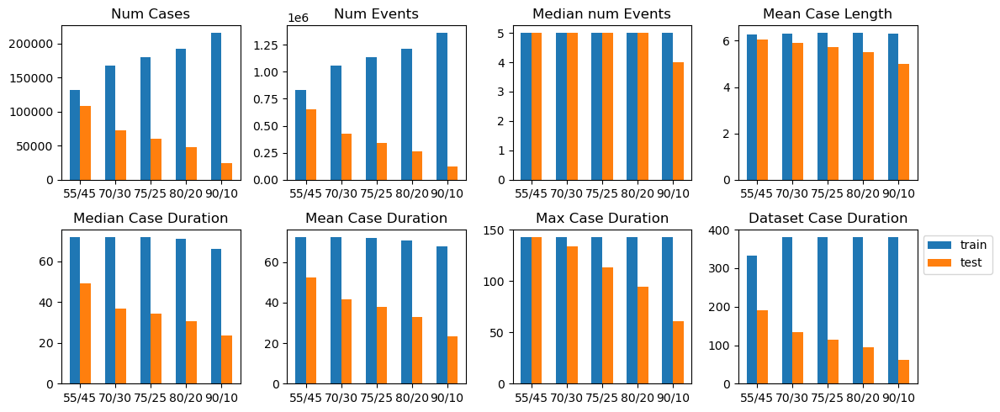

In [41]:
#bar chart
train = all_stats_df['Dataset'].str.contains('Train')
test = all_stats_df['Dataset'].str.contains('Test')

before = all_stats_df[train]
after = all_stats_df[test]

custom_labels = ['55/45', '70/30', '75/25', '80/20', '90/10']

barWidth = 0.3
fig, axs = plt.subplots(2, 4, figsize=(12, 5))
axs = axs.flatten()

for i, var in enumerate(all_stats_df.columns[1:]):
    r1 = np.arange(len(before))
    r2 = [x + barWidth for x in r1]

    axs[i].bar(r1, before[var], width=barWidth, label='train')
    axs[i].bar(r2, after[var], width=barWidth, label='test')

    #axs[i].set_xlabel('Dataset', fontweight='bold')
    axs[i].set_xticks([r + barWidth/2 for r in range(len(r1))])
    axs[i].set_xticklabels(custom_labels, rotation=0)
    axs[i].set_title(var)

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

### fix 70/30 discarding all case after certain drift point 

In [42]:
#split the dataset into 70/30 & discard all cases after the drift point
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')

end_date = pd.to_datetime("2020-04-01", utc=True) + pd.Timedelta(days=1)
ratio=0.70

train_statistics=[]
dates=[]
test_statistics=[]

for i in tqdm(range(365*2)):
    
    # preliminaries
    case_starts_df = log_remove.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = log_remove.groupby("case:concept:name")["time:timestamp"].min().to_frame()  
    #case_nr_list_start = case_starts_df.sort_values().index.array

    #iteratively discard cases after the drift point
    end_date = end_date - pd.Timedelta(days=1)
    cases_to_remove = case_starts_dff[(case_starts_dff['time:timestamp'] > end_date)].index.array
    clean_df = log_remove[~log_remove["case:concept:name"].isin(cases_to_remove)]

    # preliminaries
    case_starts_df = clean_df.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = clean_df.groupby("case:concept:name")["time:timestamp"].min().to_frame()  
    case_nr_list_start = case_starts_df.sort_values().index.array

    ### TEST SET ###
    first_test_case_nr = int(len(case_nr_list_start) * ratio)
    first_test_start_time = np.sort(case_starts_df.values)[first_test_case_nr]
    # retain cases that end after first_test_start time
    test_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values >= first_test_start_time].index.array
    df_test = clean_df[clean_df["case:concept:name"].isin(test_case_nrs)].reset_index(drop=True)
    #### TRAINING SET ###
    train_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values < first_test_start_time].index.array  # added values
    df_train = clean_df[clean_df["case:concept:name"].isin(train_case_nrs)].reset_index(drop=True)

    
    train_statistics.append(calculate_statistics(df_train, None))
    test_statistics.append(calculate_statistics(df_test, None))
    
    dates.append(end_date)

  0%|          | 0/730 [00:00<?, ?it/s]

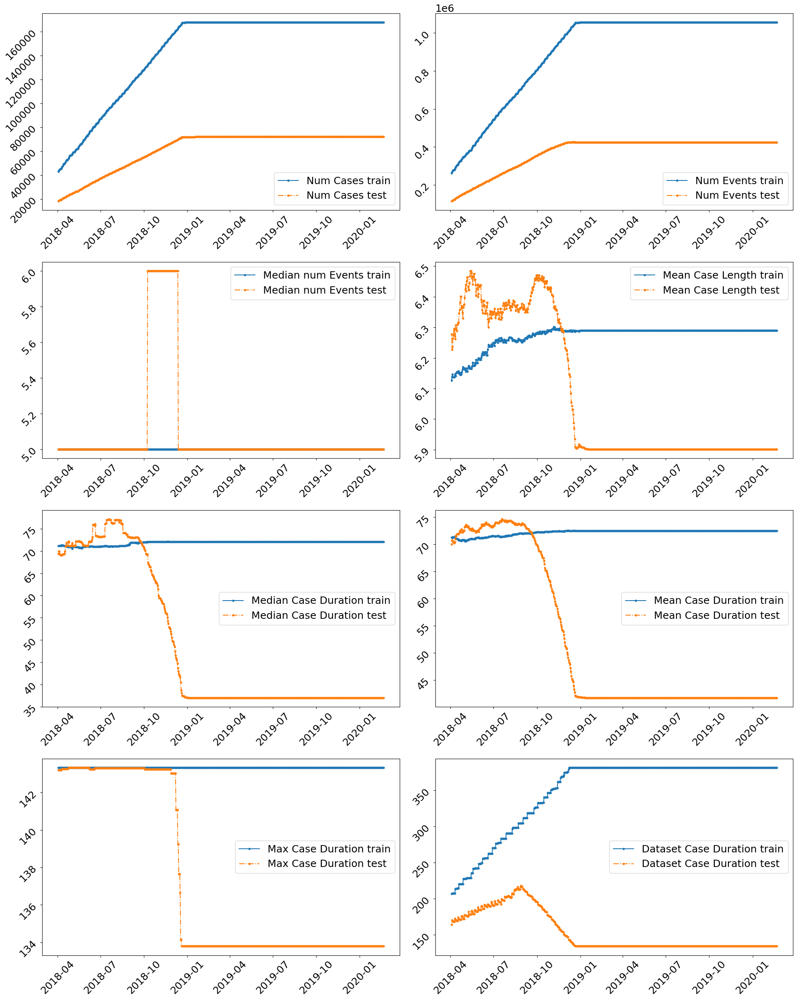

In [43]:
#calculate each stats for both train & test 
#x-axis: time point drop all cases afterward
matplotlib.rcParams.update({'font.size': 18})

fig, axs = plt.subplots(4, 2, figsize=(20, 25))
axs = axs.flatten()

for i, var in enumerate(list(train_statistics[0].keys())[1:]):
    
    
    axs[i].plot(dates[40:], [train_statistics[i][var] for i in range(len(train_statistics))][40:], marker='.', label=var +' train')
    axs[i].plot(dates[40:], [test_statistics[i][var] for i in range(len(train_statistics))][40:], marker='.', label=var +' test', linestyle='-.')


    axs[i].tick_params(labelrotation=45)


    axs[i].legend()

plt.legend()
plt.tight_layout()
#plt.savefig('plots_daily.pdf')
plt.show()

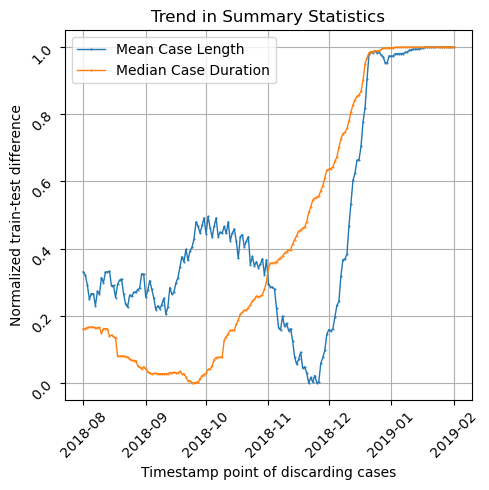

In [54]:
#plot summary stats
matplotlib.rcParams.update({'font.size': 10})


fig, axs = plt.subplots(1, 1, figsize=(5, 5))


start = pd.Timestamp('2018-08-01',  tz='UTC')
end = pd.Timestamp('2019-02-01',  tz='UTC')

labels=[]


ts_series = pd.Series(dates)
indices = ts_series[(ts_series >= start) & (ts_series <= end)].index.tolist()
dates=np.array(dates)

for _, var in enumerate(list(train_statistics[0].keys())[4:-3]):

        
    rmax=np.amax(abs(np.array([(train_statistics[i][var] - test_statistics[i][var]) for i in range(len(train_statistics))]))[indices])
    rmin=np.amin(abs(np.array([(train_statistics[i][var] - test_statistics[i][var]) for i in range(len(train_statistics))]))[indices])
    axs.plot(dates[indices], abs(np.array([(abs(train_statistics[i][var] - test_statistics[i][var]) - rmin)/(rmax-rmin) for i in range(len(train_statistics))]))[indices], marker='.', ms=1, label=var, lw=1)
    

    labels.append(var)
    
axs.tick_params(labelrotation=45)


axs.legend()
axs.grid(True)
#plt.legend(labels, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Timestamp point of discarding cases')
plt.ylabel('Normalized train-test difference')
plt.title('Trend in Summary Statistics')

plt.tight_layout()

plt.savefig('plots_daily.pdf')
plt.show()

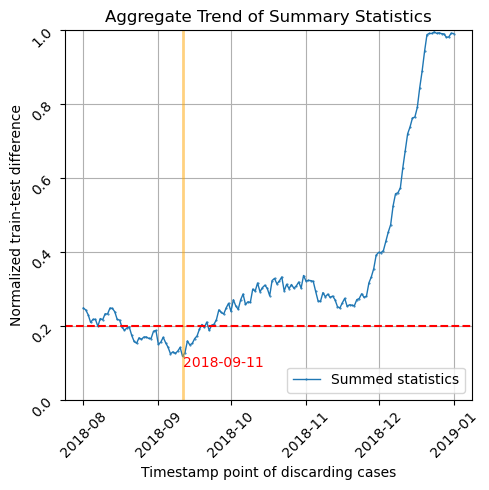

In [45]:
#plot mean of all summary stats in one line
matplotlib.rcParams.update({'font.size': 10})


fig, axs = plt.subplots(1, 1, figsize=(5, 5))
#axs = axs.flatten()


start = pd.Timestamp('2018-08-01',  tz='UTC')
end = pd.Timestamp('2019-01-01',  tz='UTC')
ts_series = pd.Series(dates)
indices = ts_series[(ts_series >= start) & (ts_series <= end)].index.tolist()

dates=np.array(dates)
summed=None

mean_bucket=0

for i, var in enumerate(list(train_statistics[0].keys())[4:-3]):
    
    rmax=np.amax(abs(np.array([(train_statistics[i][var] - test_statistics[i][var]) for i in range(len(train_statistics))]))[indices])
    rmin=np.amin(abs(np.array([(train_statistics[i][var] - test_statistics[i][var]) for i in range(len(train_statistics))]))[indices])

    
    mean_bucket+=abs(((train_statistics[-1][var] - test_statistics[-1][var]) - rmin)/(rmax-rmin))
        
    if summed is None: summed=abs(np.array([(abs(train_statistics[i][var] - test_statistics[i][var]) - rmin)/(rmax-rmin) for i in range(len(train_statistics))]))[indices]
    else: summed+=abs(np.array([(abs(train_statistics[i][var] - test_statistics[i][var]) - rmin)/(rmax-rmin) for i in range(len(train_statistics))]))[indices]
   
    
axs.plot(dates[indices], summed/2, marker='.', ms=1, lw=1,label='Summed statistics')

axs.tick_params(labelrotation=45)


axs.legend()
axs.grid(True)
plt.xlabel('Timestamp point of discarding cases')
plt.ylabel('Normalized train-test difference')
plt.title('Aggregate Trend of Summary Statistics')
plt.legend()
plt.tight_layout()
#plt.axvline(pd.Timestamp('2018-09-29'), color='yellow', lw=5, alpha=0.3, linestyle='-')
plt.axvline(pd.Timestamp('2018-09-11'), color='orange', lw=2, alpha=0.5, linestyle='-')
plt.text(pd.Timestamp('2018-09-11'), 0.1, '2018-09-11', rotation=0, verticalalignment='center', color='r', fontsize=10)
plt.axhline(y=0.2, color='r', linestyle='--')

plt.ylim([0,1])

plt.savefig('plots_daily.pdf')
plt.show()

In [46]:
#retrive the train&test every 7 days and put them to the bar chart
def with_overlap_split(log_df, discard_date):
    # preliminaries
    case_starts_df = log_df.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = log_df.groupby("case:concept:name")["time:timestamp"].min().to_frame()  

    #iteratively discard cases after the drift point
    specific_date = pd.to_datetime(discard_date, utc=True)
    cases_to_remove = case_starts_dff[(case_starts_dff['time:timestamp'] > specific_date)].index.array
    clean_df = log_df[~log_df["case:concept:name"].isin(cases_to_remove)]
    
    #split
    # preliminaries
    case_starts_df = clean_df.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = clean_df.groupby("case:concept:name")["time:timestamp"].min().to_frame()  
    case_nr_list_start = case_starts_df.sort_values().index.array

    ### TEST SET ###
    first_test_case_nr = int(len(case_nr_list_start) * 0.7)
    first_test_start_time = np.sort(case_starts_df.values)[first_test_case_nr]
    # retain cases that end after first_test_start time
    test_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values >= first_test_start_time].index.array
    df_test_clean = clean_df[clean_df["case:concept:name"].isin(test_case_nrs)].reset_index(drop=True)
    #### TRAINING SET ###
    train_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values < first_test_start_time].index.array  # added values
    df_train_clean = clean_df[clean_df["case:concept:name"].isin(train_case_nrs)].reset_index(drop=True)
    
    return [(df_train_clean, f'Train start {discard_date}'), (df_test_clean, f'Test start {discard_date}')]


start_date = pd.Timestamp("2018-09-03", tz='UTC')
end_date = pd.Timestamp('2019-01-01',  tz='UTC')
date_range = pd.date_range(start=start_date, end=end_date, freq= '7D')

datasets = []
for i in range(len(date_range)-1):
    filtered_data = with_overlap_split(log_remove, date_range[i])
    datasets+=filtered_data

In [47]:
#get 2018-09-01
train_set_clean1, test_set_clean1 = with_overlap_split(log_remove, '2018-09-01')

In [48]:
stats_list_new=[]

additional_datasets_with_labels = [
    (train_set_clean3, 'Train set (without discard)'),
    (test_set_clean3, 'Test set (without discard)'),
    train_set_clean1,
    test_set_clean1
]

datasets = additional_datasets_with_labels + datasets

In [49]:
for dataset, label in datasets:
    stats_list_new.append(calculate_statistics(dataset, label))

In [50]:
all_stats_df = pd.DataFrame(stats_list_new)
all_stats_df

,Dataset,Num Cases,Num Events,Median num Events,Mean Case Length,Median Case Duration,Mean Case Duration,Max Case Duration,Dataset Case Duration
0,Train set (without discard),167696,1054659,5.0,6.289112,72.084028,72.453451,143.328472,381.456944
1,Test set (without discard),72070,425264,5.0,5.900708,36.999306,41.698660,133.784722,134.054861
2,Train start 2018-09-01,115013,719801,5.0,6.258432,71.515278,71.971168,143.328472,304.531250
3,Test start 2018-09-01,49301,313453,5.0,6.357944,73.109722,73.742302,143.295833,213.250000
4,Train start 2018-09-03 00:00:00+00:00,115520,722523,5.0,6.254527,71.864583,72.018360,143.328472,311.543056
5,Test start 2018-09-03 00:00:00+00:00,49509,315526,5.0,6.373104,73.055556,73.693858,143.295833,213.066667
6,Train start 2018-09-10 00:00:00+00:00,119005,745308,5.0,6.262829,71.864583,72.025064,143.328472,311.543750
7,Test start 2018-09-10 00:00:00+00:00,51005,324450,5.0,6.361141,72.982639,72.921718,143.295833,209.209028
8,Train start 2018-09-17 00:00:00+00:00,122056,765128,5.0,6.268664,71.886806,72.091874,143.328472,318.494444
9,Test start 2018-09-17 00:00:00+00:00,52311,334292,5.0,6.390472,73.051389,72.293466,143.295833,204.150694


In [51]:
names=np.array(all_stats_df['Dataset'])

for i, name in enumerate(names[2:]):
    names[2+i]=name[-25:-15]
    
names=names[::2]
names[0]='No discard'
names[1]='2018-09-01'

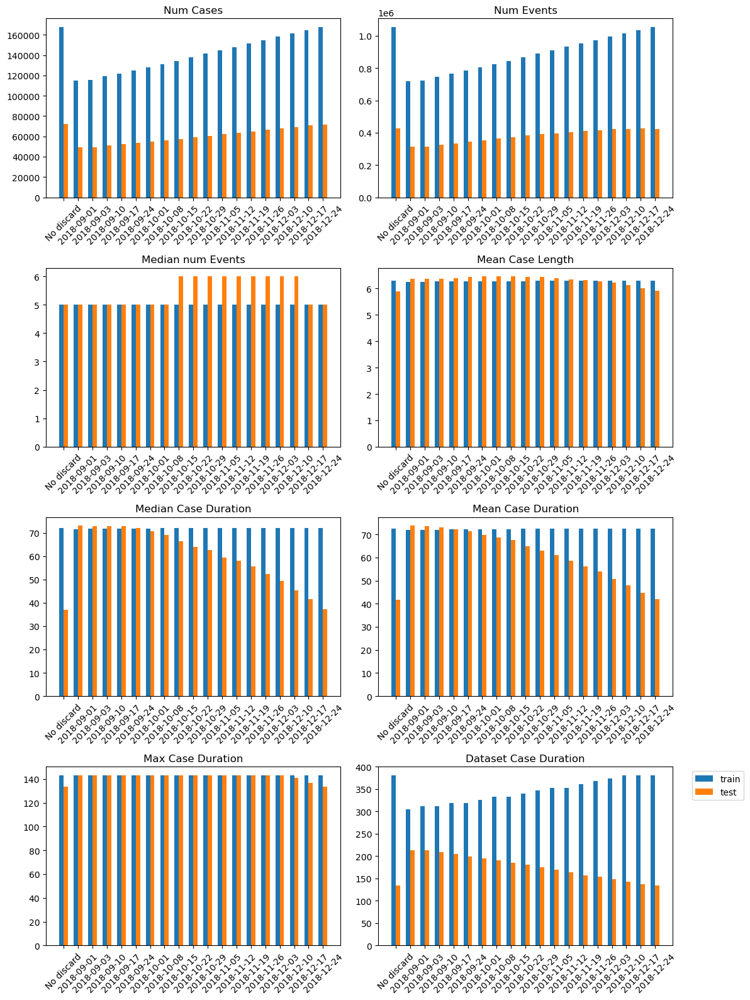

In [52]:
from matplotlib.dates import DateFormatter

train = all_stats_df['Dataset'].str.contains('Train')
test = all_stats_df['Dataset'].str.contains('Test')

before = all_stats_df[train]
after = all_stats_df[test]

barWidth = 0.3
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()

for i, var in enumerate(all_stats_df.columns[1:]):
    r1 = np.arange(len(before))
    r2 = [x + barWidth for x in r1]

    axs[i].bar(r1, before[var], width=barWidth, label='train')
    axs[i].bar(r2, after[var], width=barWidth, label='test')

    #axs[i].set_xlabel('Dataset', fontweight='bold')
    axs[i].set_xticks([r + barWidth/2 for r in range(len(r1))])
    axs[i].set_xticklabels(names, rotation=45)
    axs[i].set_title(var)
    #axs[i].legend()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

## Overlap cases - workaround approach

In [420]:
def overlap_remove_split(log_df, discard_date):

    # preliminaries
    case_starts_df = log_df.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = log_df.groupby("case:concept:name")["time:timestamp"].min().to_frame()  

    #iteratively discard cases after the drift point
    specific_date = pd.to_datetime(discard_date, utc=True)
    cases_to_remove = case_starts_dff[(case_starts_dff['time:timestamp'] > specific_date)].index.array
    clean_df = log_df[~log_df["case:concept:name"].isin(cases_to_remove)]
    
     #split
    ### TEST SET ###
    case_starts_df = clean_df.groupby("case:concept:name")["time:timestamp"].min()
    case_starts_dff = clean_df.groupby("case:concept:name")["time:timestamp"].min().to_frame()  
    case_nr_list_start = case_starts_df.sort_values().index.array
    
    first_test_case_nr = int(len(case_nr_list_start) * 0.7)
    first_test_start_time = np.sort(case_starts_df.values)[first_test_case_nr]
    # retain cases that end after first_test_start time
    test_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values >= first_test_start_time].index.array
    test_set = clean_df[clean_df["case:concept:name"].isin(test_case_nrs)].reset_index(drop=True)
    #### TRAINING SET ###
    train_case_nrs = case_starts_dff[case_starts_dff["time:timestamp"].values < first_test_start_time].index.array  # added values
    df_train_all = clean_df[clean_df["case:concept:name"].isin(train_case_nrs)].reset_index(drop=True)

    # drop prefixes in train set that are past latest_start
    train_set = df_train_all[df_train_all["time:timestamp"].values< first_test_start_time]
    
    return [(train_set, f'Train start {discard_date}'), (test_set, f'Test start {discard_date}')]


# DyLoPro plot

In [174]:
import DyLoPro as dlp

In [170]:
"""
Contains the preprocessing pipeline for the event logs examined in each 
case study. 
"""
import pandas as pd 
import numpy as np

def preprocess_bpic19(log):
    """Preprocess the bpic19 event log. 

    Parameters
    ----------
    log : pandas.DataFrame 
        Event log.

    Returns
    -------
    log : pandas.DataFrame
        Preprocessed event log.
    """
    # Convert timestamp column to datetime64[ns, UTC] dtype 
    log['time:timestamp'] = pd.to_datetime(log['time:timestamp'], format='%Y-%m-%d %H:%M:%S%z').dt.tz_convert('UTC')

    # Convert 2 cols to object dtype. 
    log['case:Item'] = log['case:Item'].astype('object')
    log['case:Purchasing Document'] = log['case:Purchasing Document'].astype('object')
    
    return log 



def preprocess_bpic17(log):
    """Preprocess the bpic17 event log. 

    Parameters
    ----------
    log : pandas.DataFrame 
        Event log.

    Returns
    -------
    log : pandas.DataFrame
        Preprocessed event log.
    """

    # Inner function to label (1-0) for 3 new target cols
    def _labeling(row, target):
        if row['last_o_act'] == target:
            return 1
        else:
            return 0

    log['time:timestamp'] = pd.to_datetime(log['time:timestamp'], format = 'mixed').dt.tz_convert('UTC')

    # Specifying which activities (if occurring) last indicate whether a case is ...
    relevant_offer_events = ["O_Accepted", "O_Refused", "O_Cancelled"]

    # Retaining only the Offer events 
    log_offer_events = log[log['EventOrigin'] == "Offer"]

    # Getting a dataframe that gives the last Offer activity for each case. 
    last_Offer_Activities = log_offer_events.groupby('case:concept:name', sort=False).last().reset_index()[['case:concept:name','concept:name']]
    last_Offer_Activities.columns = ['case:concept:name', 'last_o_act']

    # Adding that column as a case feature to the main log by merging on case:concept:name: 
    log = log.merge(last_Offer_Activities, on = 'case:concept:name', how = 'left')

    # Subsetting last_Offer_Activities dataframe for only the invalid cases. 
    last_Offer_Activities_invalid = last_Offer_Activities[~last_Offer_Activities['last_o_act'].isin(relevant_offer_events)]

    invalid_cases_list = list(last_Offer_Activities_invalid['case:concept:name'])

    # Dropping all invalid cases (and their events) from the main event log 
    log = log[~log['case:concept:name'].isin(invalid_cases_list)]

    # Adding the three 1-0 target columns 'case accepted', 'case refused', 'case canceled'

    # and adding another categorical case feature that contains 3 levels, indicating whether 
    # a case is 'Accepted', 'Refused' or 'Canceled':
    log['case:outcome'] = log['last_o_act'].copy()
    categorical_outcome_labels = ['Accepted', 'Refused', 'Canceled']
    binary_outcome_colnames = ['case accepted', 'case refused', 'case canceled']
    for idx in range(3):
        offer_event = relevant_offer_events[idx]
        out_label = categorical_outcome_labels[idx]
        out_colname = binary_outcome_colnames[idx]
        log['case:outcome'] = np.where(log['last_o_act'] == offer_event, out_label, log['case:outcome'])
        log[out_colname] = np.where(log['last_o_act'] == offer_event, 1, 0)
    
    log = log.drop(['last_o_act'], axis = 1)

    return log 

def preprocess_RTFM(log):
    """Preprocess the Road Traffic Fines Management event log. 

    Parameters
    ----------
    log : pandas.DataFrame 
        Event log.

    Returns
    -------
    log : pandas.DataFrame
        Preprocessed event log.
    """

    # Converting the appropriate columns to object dtype 
    to_object = {'org:resource': object, 'article': object, 'points': object}

    # Convert columns to the specified dtypes
    log = log.astype(to_object)

    # Covnert timestamp col to appropriate datetime format 
    log['time:timestamp'] = pd.to_datetime(log['time:timestamp'], utc=True)

    # Drop the 'matricola' column
    log = log.drop('matricola', axis=1)

    return log 

In [175]:
#from preprocess_case_studies import preprocess_bpic19
path_to_bpic19 = "BPIC19.csv"
log = pd.read_csv(path_to_bpic19, header = 0)
log = preprocess_bpic19(log)

log['time:timestamp'] = pd.to_datetime(log['time:timestamp'], utc=True)

In [176]:
categorical_casefeatures=[ 'case:Spend area text', 'case:Company', 'case:Document Type', 
                          'case:Sub spend area text', 'case:Purchasing Document', 
                           'case:Vendor', 'case:Item Type', 
                          'case:Item Category', 'case:Spend classification text', 
                          'case:GR-Based Inv. Verif.', 'case:Goods Receipt']
categorical_eventfeatures = ['org:resource', 'concept:name', 'User']
numeric_eventfeatures= ['Cumulative net worth (EUR)']

In [180]:
BPIC19_plots = dlp.DynamicLogPlots(log, case_id_key = 'case:concept:name', activity_key = 'concept:name', 
                                   timestamp_key = 'time:timestamp', categorical_casefeatures = categorical_casefeatures, 
                                   categorical_eventfeatures = categorical_eventfeatures, 
                                   numerical_eventfeatures = numeric_eventfeatures, start_date = "01/01/2018")

Preprocessing the data...


100%|████████████████████████████| 1587925/1587925 [00:00<00:00, 5122189.96it/s]


Computing additional weekly Throughput Time aggregations for each of the 10 most


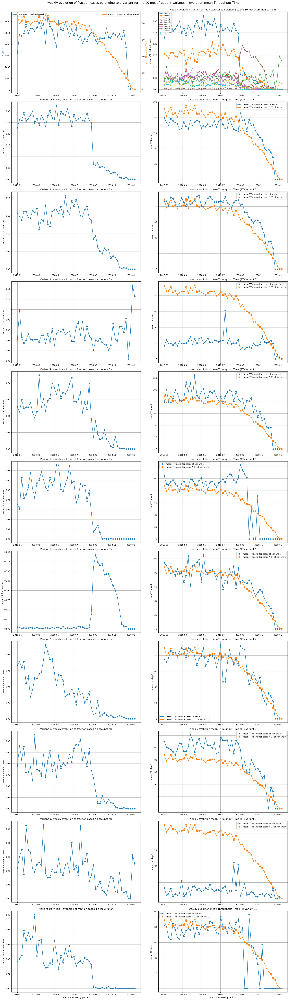

In [181]:
BPIC19_plots.topK_variants_evol(max_k = 10, plt_type = 'type_tt', xtr_outlier_rem = False)

Computing the weekly aggregations for each of the 10 most frequently occurring l


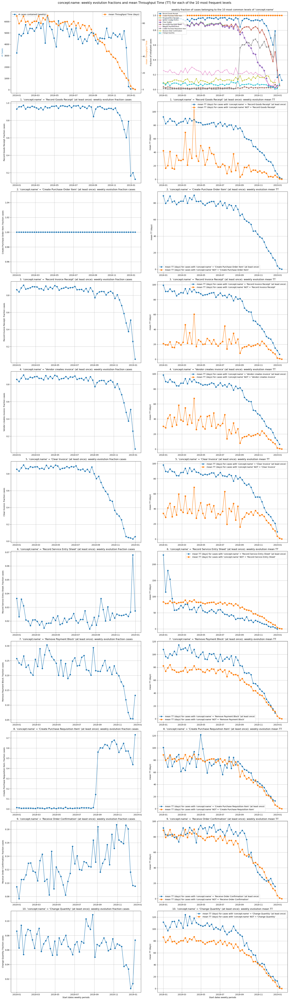

In [182]:
#'concept:name' - Representation type: Throughput Time (TT)
BPIC19_plots.topK_categorical_eventftr_evol(event_feature='concept:name', plt_type = 'type_tt', xtr_outlier_rem = False)

Computing the weekly aggregations for each of the 10 most frequently occurring l


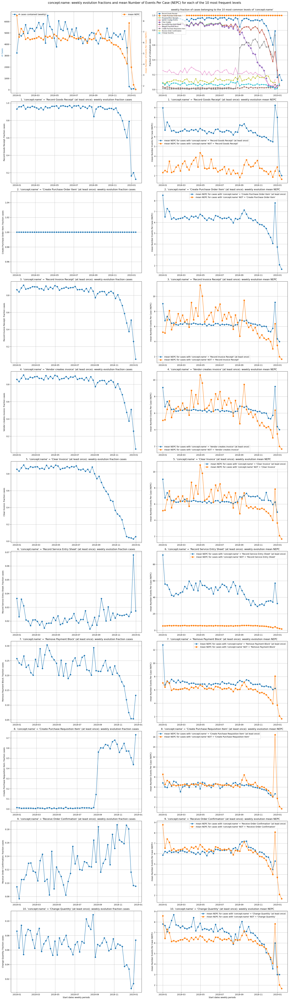

In [183]:
#'concept:name' - Representation type: Case Length (NEPC)
BPIC19_plots.topK_categorical_eventftr_evol(event_feature='concept:name', plt_type = 'type_events_case', xtr_outlier_rem = False)

In [184]:
#categorical case feature
categorical_casefeatures

['case:Spend area text',
 'case:Company',
 'case:Document Type',
 'case:Sub spend area text',
 'case:Purchasing Document',
 'case:Vendor',
 'case:Item Type',
 'case:Item Category',
 'case:Spend classification text',
 'case:GR-Based Inv. Verif.',
 'case:Goods Receipt']

Computing additional weekly aggregations of the Throughput Time for each of the 


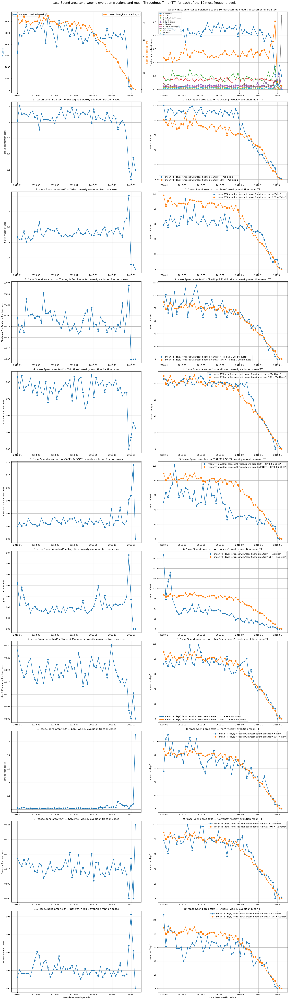

In [185]:
#'case:Spend area text' - Representation type: Throughput Time (TT)
BPIC19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Spend area text', plt_type = 'type_tt', xtr_outlier_rem = False)

Computing additional weekly aggregations of the Number of Events Per Case (NEPC)


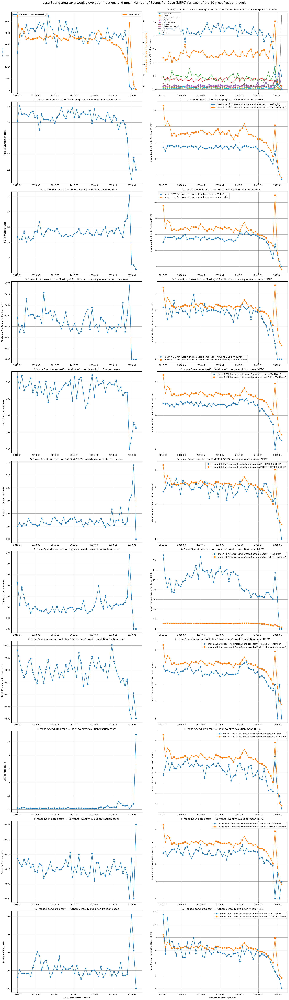

In [186]:
#'case:Spend area text' - Representation type: Case Length (NEPC)
BPIC19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Spend area text', plt_type = 'type_events_case', xtr_outlier_rem = False)